<a href="https://colab.research.google.com/github/sofiienko/gan_generated_detection/blob/main/NovemberFirst_CustomDataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Dataset load

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!mkdir -p ~/.kaggle
!cp '/content/drive/My Drive/kaggle.json' ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d xhlulu/140k-real-and-fake-faces
!unzip /content/140k-real-and-fake-faces.zip -d '/real-and-fake-faces'
!kaggle datasets download -d ciplab/real-and-fake-face-detection
!unzip /content/real-and-fake-face-detection.zip -d '/real-and-fake-faces2'

Separete real and fake

In [ ]:
!kaggle datasets download -d tunguz/1-million-fake-faces-7
!unzip 1-million-fake-faces-7.zip -d /content/fake

In [ ]:
!kaggle datasets download -d xhlulu/flickrfaceshq-dataset-nvidia-resized-256px
!unzip '/content/flickrfaceshq-dataset-nvidia-resized-256px.zip' -d /content/real

In [ ]:
!zip -r fake.zip /content/fake/1m_faces_91__99/1m_faces_99 

Celeba

In [ ]:
!kaggle datasets download -d jessicali9530/celeba-dataset

 99% 1.31G/1.33G [00:14<00:00, 125MB/s]
100% 1.33G/1.33G [00:14<00:00, 96.6MB/s]


In [ ]:
!unzip /content/celeba-dataset.zip -d /content/real_celeba

#Const

In [ ]:
IMG_SIZE = (224, 224)
IMG_SHAPE = IMG_SIZE + (3,)

#Imports

In [ ]:
import os
import sys
import io

from tqdm.notebook import tqdm 
from sklearn.model_selection import train_test_split
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50


# Test for server


In [ ]:
def get_images(folders):
  paths = []
  for folder in folders:
    for dirname, _, filenames in tqdm(os.walk(folder)):
      for filename in filenames:
        paths.append(os.path.join(dirname, filename))

  return paths

In [ ]:
fake_images_folders = [
    #                   '/content/fake/1m_faces_91__99',
   # '/real-and-fake-faces/real_vs_fake/real-vs-fake/test/fake', 
   # '/real-and-fake-faces/real_vs_fake/real-vs-fake/train/fake',  
  #  '/real-and-fake-faces2/real_and_fake_face/training_fake' ,
  #  '/real-and-fake-faces2/real_and_fake_face_detection/real_and_fake_face/training_fake'              
]
real_images_folder = [
              #        '/content/real/resized',
   # '/real-and-fake-faces/real_vs_fake/real-vs-fake/test/real', 
   # '/real-and-fake-faces/real_vs_fake/real-vs-fake/train/real',  
   '/content/real_celeba/img_align_celeba/img_align_celeba'              
]

fake_paths = get_images(fake_images_folders)
real_paths = get_images(real_images_folder)

print(f'real {len(real_paths)}')
print(f'fake {len(fake_paths)}')


real 202599
fake 0


In [ ]:
def split_and_add_label(paths, label):
  train, test = train_test_split(paths, test_size=0.3, random_state=2020)

  train_df = pd.DataFrame( train, columns=['filename'])
  train_df['class'] = label

  test_df = pd.DataFrame(test, columns=['filename'])
  test_df['class'] = label

  return (train_df,test_df)

In [ ]:
train_real, test_real = split_and_add_label(real_paths, 'REAL')
train_fake, test_fake = split_and_add_label(fake_paths, 'FAKE')

print(f'REAL: train={len(train_real)} test={len(test_real)}')
print(f'FAKE: train={len(train_fake)} test={len(test_fake)}')

REAL: train=49000 test=21000
FAKE: train=63000 test=27000


In [ ]:
train_df = pd.concat([train_real, train_fake]).sample(frac=1)
test_df = pd.concat([test_real, test_fake]).sample(frac=1)

In [ ]:
test_df

##SRM preprocessing

In [ ]:
import numpy as np
import cv2

q = [4.0, 12.0, 2.0]
filter1 = [[0, 0, 0, 0, 0],
           [0, -1, 2, -1, 0],
           [0, 2, -4, 2, 0],
           [0, -1, 2, -1, 0],
           [0, 0, 0, 0, 0]]
filter2 = [[-1, 2, -2, 2, -1],
           [2, -6, 8, -6, 2],
           [-2, 8, -12, 8, -2],
           [2, -6, 8, -6, 2],
           [-1, 2, -2, 2, -1]]
filter3 = [[0, 0, 0, 0, 0],
           [0, 0, 0, 0, 0],
           [0, 1, -2, 1, 0],
           [0, 0, 0, 0, 0],
           [0, 0, 0, 0, 0]]

filter1 = np.asarray(filter1, dtype=float) / q[0]
filter2 = np.asarray(filter2, dtype=float) / q[1]
filter3 = np.asarray(filter3, dtype=float) / q[2]
    
filters = filter1+filter2+filter3

def SRM_preprocessing_filter(img):
  return cv2.filter2D(img,-1,filters)

NameError: ignored

In [ ]:
#datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2, preprocessing_function=SRM_preprocessing_filter)
train_gen = datagen.flow_from_dataframe(
    train_df,
    target_size=(224, 224),
    batch_size=64,
    class_mode='binary',
    subset='training'
)

val_gen = datagen.flow_from_dataframe(
    test_df,
    target_size=(224, 224),
    batch_size=64,
    class_mode='binary',
    subset='validation'
)

NameError: ignored

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


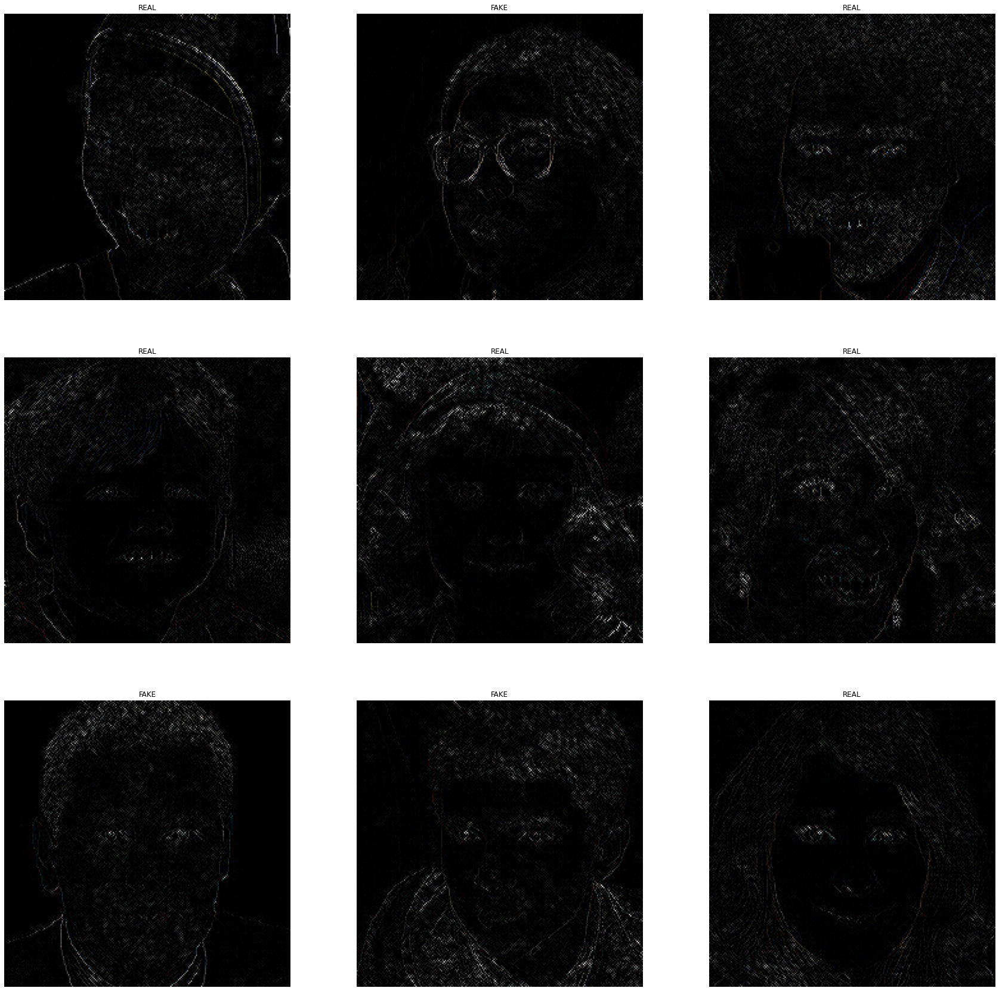

In [ ]:
batch = val_gen
class_names = batch.class_mode

plt.figure(figsize=(30, 30))
images, labels = next(batch)
label_names = list(batch.class_indices.keys())
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  #plt.imshow((images[i] * 255).astype(np.uint8))
  #plt.imshow((images[i] * 255).astype(np.uint8)/255.)
  plt.imshow(images[i])
  plt.title(label_names[int(labels[i])])
  plt.axis("off")

In [ ]:
labels 

array([0., 0., 0., 1., 0., 0., 0., 1., 1., 0., 0., 0., 1., 0., 0., 1., 0.,
       0., 0., 1., 1., 0., 0., 1., 1., 1., 0., 0., 0., 1., 0., 0., 0., 1.,
       0., 0., 0., 1., 0., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1.,
       1., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 1., 0.], dtype=float32)

In [ ]:
images, labels = next(batch)
fig=plt.figure(figsize=(8, 8))
fig.add_subplot(rows, columns, 1)
plt.imshow(images[0])
fig.add_subplot(rows, columns, 2)
plt.title(label_names[int(labels[0])])
plt.imshow(SRM_preprocessing_filter(images[0]))

#Model based on ResNet50

In [ ]:
from tensorflow import keras
from keras.layers import Dropout, Flatten, Dense
from keras.applications.resnet50 import ResNet50
from keras.models import Model,Sequential

In [ ]:
resnet_model=ResNet50(weights='imagenet', include_top=False, input_shape=IMG_SHAPE)

resnet_model.summary()

In [ ]:
def get_model_ResNet50():
  resnet_model=ResNet50(weights='imagenet', include_top=False, input_shape=IMG_SHAPE)
  model=Sequential()
  model.add(resnet_model)

  top_model=Sequential()
  top_model.add(Flatten(input_shape=(7, 7, 2048)))
  top_model.add(Dense(128, activation='relu'))
  top_model.add(Dropout(0.2))
  top_model.add(Dense(64, activation='relu'))
  top_model.add(Dropout(0.2))
  top_model.add(Dense(2, activation='sigmoid'))

  model.add(top_model)

  for layer in model.layers[0].layers[:171]:
    layer.trainable=False
  model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=1e-3), metrics=['accuracy'])

  return model

In [ ]:
def build_model(pretrained):
    model = Sequential([
        pretrained,
        layers.GlobalAveragePooling2D(),
        layers.Dense(1, activation='sigmoid')
    ])
    
    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(),
        metrics=['accuracy']
    )
    
    return model

#Setup

TensorFlow Profiler

In [ ]:
from datetime import datetime
from packaging import version
import tensorflow as tf


###Confusiin matrix

In [ ]:
def plot_confusion_matrix(cm, class_names):
    """
    Returns a matplotlib figure containing the plotted confusion matrix.
    
    Args:
       cm (array, shape = [n, n]): a confusion matrix of integer classes
       class_names (array, shape = [n]): String names of the integer classes
    """
    
    figure = plt.figure(figsize=(8, 8))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title("Confusion matrix")
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)
    
    # Normalize the confusion matrix.
    cm = np.around(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], decimals=2)
    
    # Use white text if squares are dark; otherwise black.
    threshold = cm.max() / 2.
    
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        color = "white" if cm[i, j] > threshold else "black"
        plt.text(j, i, cm[i, j], horizontalalignment="center", color=color)
        
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    return figure

def plot_to_image(figure):
    """
    Converts the matplotlib plot specified by 'figure' to a PNG image and
    returns it. The supplied figure is closed and inaccessible after this call.
    """
  
    buf = io.BytesIO()
    plt.savefig(buf, format='png')
    plt.close(figure)
    buf.seek(0)
    image = tf.image.decode_png(buf.getvalue(), channels=4)
    image = tf.expand_dims(image, 0)
    
    return image

In [ ]:
!pip install -U tensorboard_plugin_profile

     |████████████████████████████████| 1.1MB 8.3MB/s 


In [ ]:
# Load the TensorBoard notebook extension.
%load_ext tensorboard

In [ ]:
base_path ='/content/drive/My Drive/RealFakeDimplomeNovember/densenet'
logdir = base_path + "/logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
training_store_path = base_path +  '/model_onemore_DenseNet121_weights.{epoch:02d}-{val_loss:.2f}.hdf5'

tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir,
                                                   histogram_freq=1,
                                                   profile_batch = '500,520')

file_writer_cm = tf.summary.create_file_writer(logdir + '/cm')

from keras.callbacks import ModelCheckpoint,EarlyStopping

checkpoint = ModelCheckpoint(training_store_path, monitor='val_accuracy',mode='max',save_best_only=True,verbose=1)
early_stopping = EarlyStopping(monitor = 'val_loss',min_delta = 0.005, patience = 3, verbose = 1,restore_best_weights = True)

callbacks_list = [tensorboard_callback,
            #file_writer_cm,
            #cm_callback,
            checkpoint,
            early_stopping]

In [ ]:
def log_confusion_matrix(epoch, logs):
    
    # EXERCISE: Use the model to predict the values from the test_images.
    test_pred_raw = model.predict(test_images)
    
    test_pred = np.argmax(test_pred_raw, axis=1)
    
    # EXERCISE: Calculate the confusion matrix using sklearn.metrics
    cm = sklearn.metrics.confusion_matrix(test_labels, test_pred)
    
    figure = plot_confusion_matrix(cm, class_names=class_names)
    cm_image = plot_to_image(figure)
    
    # Log the confusion matrix as an image summary.
    with file_writer_cm.as_default():
        tf.summary.image("Confusion Matrix", cm_image, step=epoch)

# Define the per-epoch callback.
cm_callback = keras.callbacks.LambdaCallback(on_epoch_end=log_confusion_matrix)

In [ ]:
densenet = DenseNet121(
    include_top=False,
    input_shape=(224,224,3)
)
model = build_model(densenet)

29089792/29084464 [==============================] - 1s 0us/step


In [ ]:
%tensorboard --logdir '/content/drive/My Drive/RealFakeDimplomeNovember/logs'

history = model.fit(train_gen,
                    epochs=50,
                    steps_per_epoch=250,
                    validation_steps=45,
                    validation_data=val_gen,
                    callbacks=callbacks_list)

In [ ]:
model.evaluate(val_gen)

45/45 [==============================] - 10s 212ms/step - loss: 0.2710 - accuracy: 0.9243


[0.27098482847213745, 0.9243055582046509]

#Classification smalles model

*   List item
*   List item



In [ ]:
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
#datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2, preprocessing_function=SRM_preprocessing_filter)
train_gen_categorical = datagen.flow_from_dataframe(
    train_df,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical',
    subset='training'
)
validation_gen_categorical = datagen.flow_from_dataframe(
    test_df,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical',
    subset='validation'
)

Found 68276 validated image filenames belonging to 2 classes.
Found 7315 validated image filenames belonging to 2 classes.


In [ ]:
label_names

['FAKE', 'REAL']

In [ ]:
def get_small_clasification_network():
  model=Sequential()
  model.add(Conv2D(32,(3,3),activation='relu',input_shape=IMG_SHAPE))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2,2)))
  model.add(Dropout(0.25))

  model.add(Conv2D(64,(3,3),activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2,2)))
  model.add(Dropout(0.25))

  model.add(Conv2D(128,(3,3),activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2,2)))
  model.add(Dropout(0.25))

  model.add(Flatten())
  model.add(Dense(512,activation='relu'))
  model.add(BatchNormalization())
  model.add(Dropout(0.5))
  model.add(Dense(2,activation='softmax'))

  model.compile(loss='categorical_crossentropy',
  optimizer='rmsprop',metrics=['accuracy'])
  
  return model

In [ ]:
base_path ='/content/drive/My Drive/RealFakeDimplomeNovember/Small_Classification'
logdir = base_path + "/logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
training_store_path = base_path +  '/model_onemore_DenseNet121_weights.{epoch:02d}-{val_loss:.2f}.hdf5'

tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir,
                                                   histogram_freq=1,
                                                   profile_batch = '500,520')

file_writer_cm = tf.summary.create_file_writer(logdir + '/cm')

from keras.callbacks import ModelCheckpoint,EarlyStopping

checkpoint = ModelCheckpoint(training_store_path, monitor='val_accuracy',mode='max',save_best_only=True,verbose=1)
early_stopping = EarlyStopping(monitor = 'val_loss',min_delta = 0.005, patience = 3, verbose = 1,restore_best_weights = True)

callbacks_list = [tensorboard_callback,
            #file_writer_cm,
            #cm_callback,
            checkpoint,
            early_stopping]

In [ ]:
model = get_small_clasification_network()

NameError: ignored

In [ ]:
%tensorboard --logdir '/content/drive/My Drive/RealFakeDimplomeNovember/Small_Classification/logs'

history = model.fit(train_gen_categorical,
                    epochs=50,
                    steps_per_epoch=250,
                    validation_steps=45,
                    validation_data=validation_gen_categorical,
                    callbacks=callbacks_list)

#Classification Dense net model

In [ ]:
from datetime import datetime
from packaging import version
import tensorflow as tf


In [ ]:
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
#datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2, preprocessing_function=SRM_preprocessing_filter)
train_gen_categorical = datagen.flow_from_dataframe(
    train_df,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical',
    subset='training'
)
validation_gen_categorical = datagen.flow_from_dataframe(
    test_df,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical',
    subset='validation'
)

Found 89600 validated image filenames belonging to 2 classes.
Found 9600 validated image filenames belonging to 2 classes.


In [ ]:
def build_model(pretrained):
    model = Sequential([
        pretrained,
        layers.GlobalAveragePooling2D(),
        layers.Dense(2, activation='softmax')])
    
    model.compile(
        loss='categorical_crossentropy',
        optimizer=Adam(),
        metrics=['accuracy']
    )
    
    return model

In [ ]:
densenet = DenseNet121(
    include_top=False,
    input_shape=(224,224,3)
)
model = build_model(densenet)

29089792/29084464 [==============================] - 2s 0us/step


In [ ]:
base_path ='/content/drive/MyDrive/RealFakeDimplomeNovember/DenseNet_Classification2'
logdir = base_path + "/logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
training_store_path = base_path +  '/model_onemore_DenseNet121_weights.{epoch:02d}-{val_loss:.2f}.hdf5'

tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir,
                                                   histogram_freq=1,
                                                   profile_batch = '500,520')

file_writer_cm = tf.summary.create_file_writer(logdir + '/cm')

from keras.callbacks import ModelCheckpoint,EarlyStopping

checkpoint = ModelCheckpoint(training_store_path, monitor='val_accuracy',mode='max',save_best_only=True,verbose=1)
early_stopping = EarlyStopping(monitor = 'val_loss',min_delta = 0.005, patience = 3, verbose = 1,restore_best_weights = True)

callbacks_list = [tensorboard_callback,
            #file_writer_cm,
            #cm_callback,
            checkpoint,
            early_stopping]

In [ ]:
# Load the TensorBoard notebook extension.
%load_ext tensorboard

In [ ]:
%tensorboard --logdir '/content/drive/My Drive/RealFakeDimplomeNovember/DenseNet_Classification2/logs'

history = model.fit(train_gen_categorical,
                    epochs=50,
                    steps_per_epoch=250,
                    validation_steps=45,
                    validation_data=validation_gen_categorical,
                    callbacks=callbacks_list)

#End

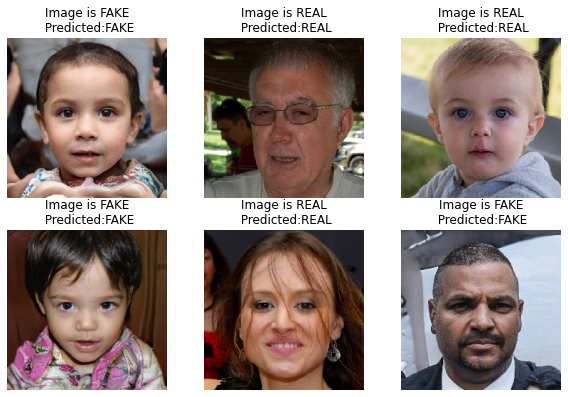

In [ ]:
generator = validation_gen_categorical
N = 6
images, labels = next(generator)

class_names = generator.class_mode

predicted = model.predict(images[:N])
result_df= pd.DataFrame()
result_df['category'] = np.argmax(predicted, axis=-1)
label_map = dict((v,k) for k,v in generator.class_indices.items())
result_df['category'] = result_df['category'].replace(label_map)


plt.figure(figsize=(10, 10))

labels = np.argmax(labels , axis=-1)
label_names = list(generator.class_indices.keys())
for i in range(N):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(images[i])
  plt.title(f"Image is {label_names[int(labels[i])]}\n Predicted:{result_df.iloc[i]['category']}")
  plt.axis("off")



In [ ]:
result_df.iloc[2]['category']

'REAL'

In [ ]:
labels

In [ ]:
predicted = model.predict(validation_gen_categorical)

In [ ]:
predicted

In [ ]:
print()

In [ ]:
result_df

#Test

In [ ]:
fake_images_folders2 = [
    '/content/fake/1m_faces_91__99', 
             
]
real_images_folder2 = [
    '/content/real/resized',                
]

fake2_paths = get_images(fake_images_folders2)
real2_paths = get_images(real_images_folder2)

In [ ]:
train_real2, test_real2 = split_and_add_label(real2_paths, 'REAL')
train_fake2, test_fake2 = split_and_add_label(fake2_paths, 'FAKE')

print(f'REAL: train={len(train_real2)} test={len(test_real2)}')
print(f'FAKE: train={len(train_fake2)} test={len(test_fake2)}')

REAL: train=49000 test=21000
FAKE: train=63000 test=27000


In [ ]:
train_df2 = pd.concat([train_real2, train_fake2]).sample(frac = 1)
test_df2 = pd.concat([test_real2, test_fake2]).sample(frac = 1)

In [ ]:
test_df2

In [ ]:
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2, preprocessing_function=SRM_preprocessing_filter)
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
train_gen2 = datagen.flow_from_dataframe(
    train_df2,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical',
    subset='training'
)

val_gen2 = datagen.flow_from_dataframe(
    test_df2,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical',
    subset='validation'
)

Found 89600 validated image filenames belonging to 2 classes.
Found 9600 validated image filenames belonging to 2 classes.


In [ ]:
import glob
import numpy as np
from keras.preprocessing import image
import random

batch4 = []



In [ ]:
def get_batch_from_dir(path, max_number):
  batch = []

  items = glob.glob(path)
  if len(items )==0: 
    raise Exception("No items") 
  for i in range(max_number):
    img = np.array(image.load_img(random.choice(items), target_size=IMG_SIZE))/255.
    batch.append(img)
  
  if len(batch)==0: 
    raise Exception("Batch empty") 
  return np.array(batch)

In [ ]:
batch_real = get_batch_from_dir('/content/real/resized/*.jpg',30)
batch_fake = get_batch_from_dir('/content/fake/1m_faces_91__99/1m_faces_94/*.jpg',30)
my_fake = get_batch_from_dir('/content/*.jpg', 3)
np.argmax(model.predict(my_fake),axis=-1)



array([0, 0, 0])

In [ ]:
model.save("/content/drive/My Drive/Densenet_categorical_10_11_20")

INFO:tensorflow:Assets written to: /content/drive/My Drive/Densenet_categorical_10_11_20/assets


#Just for future 

# New Section

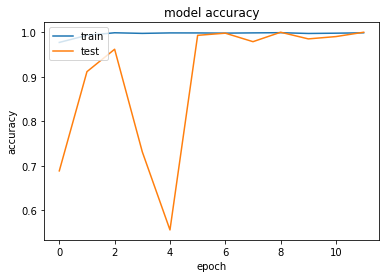

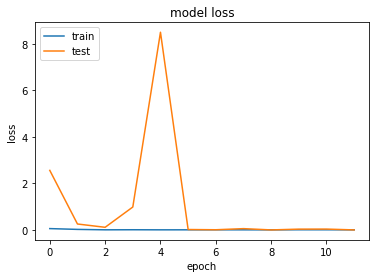

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D,Activation,MaxPooling2D,Dense,Flatten,Dropout
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from IPython.display import display
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.metrics import classification_report, confusion_matrix

# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()




In [ ]:
from google.colab import files
files.upload()

Saving image4.jpg to image4.jpg
Saving image3.jpg to image3.jpg
Saving image1.jpg to image1.jpg
Saving image.jpg to image.jpg


{'image.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x02\x02\x01\x01\x02\x01\x01\x01\x02\x02\x02\x02\x02\x02\x02\x02\x02\x01\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\xff\xdb\x00C\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x02\x01\x01\x01\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\xff\xc2\x00\x11\x08\x04\x00\x04\x00\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1e\x00\x00\x02\x02\x03\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x04\x05\x03\x06\x02\x07\x08\x01\t\x00\n\xff\xc4\x00\x1b\x01\x00\x02\x03\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x03\x01\x04\x05\x00\x06\x07\xff\xda\x00\x0c\x03\x01\x00\x02\x10\x03\x10\x00\x00\x01\

#Expiriments

In [ ]:
!pip install tf-explain

     |████████████████████████████████| 51kB 3.2MB/s 


In [ ]:
import tf_explain

In [ ]:
images, labels = next(generator)

In [ ]:
explainer = tf_explain.core.GradCAM()
grid = explainer.explain(images[:2], model, class_index = 0)  # 281 is the tabby cat index in ImageNet


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet121 (Functional)     (None, 7, 7, 1024)        7037504   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1024)              0         
_________________________________________________________________
dense (Dense)                (None, 2)                 2050      
Total params: 7,039,554
Trainable params: 6,955,906
Non-trainable params: 83,648
_________________________________________________________________


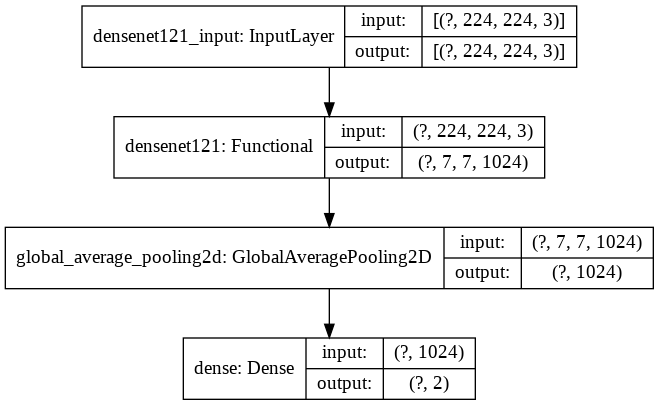

In [ ]:
dot_img_file = '/tmp/model_1.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
from keras import backend as K

def get_layer_outputs():
    test_image = images[0]
    outputs    = [layer.output for layer in model.layers]          # all layer outputs
    comp_graph = [K.function([model.input]+ [K.learning_phase()], [output]) for output in outputs]  # evaluation functions

    # Testing
    layer_outputs_list = [op([test_image, 1.]) for op in comp_graph]
    layer_outputs = []

    for layer_output in layer_outputs_list:
        print(layer_output[0][0].shape, end='\n-------------------\n')
        layer_outputs.append(layer_output[0][0])

    return layer_outputs

def plot_layer_outputs(layer_number):    
    layer_outputs = get_layer_outputs()

    x_max = layer_outputs[layer_number].shape[0]
    y_max = layer_outputs[layer_number].shape[1]
    n     = layer_outputs[layer_number].shape[2]

    L = []
    for i in range(n):
        L.append(np.zeros((x_max, y_max)))

    for i in range(n):
        for x in range(x_max):
            for y in range(y_max):
                L[i][x][y] = layer_outputs[layer_number][x][y][i]


    for img in L:
        plt.figure()
        plt.imshow(img, interpolation='nearest')

In [ ]:
model.layers

In [ ]:
ixs = [2, 5, 9, 13, 17]
outputs = [model.layers[i].output for i in ixs]
model = Model(inputs=model.inputs, outputs=outputs)
# load the image with the required shape
img = images[0]
# convert the image to an array
img = img_to_array(img)
# expand dimensions so that it represents a single 'sample'
img = expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)
# get feature map for first hidden layer
feature_maps = model.predict(img)
# plot the output from each block
square = 8
for fmap in feature_maps:
	# plot all 64 maps in an 8x8 squares
	ix = 1
	for _ in range(square):
		for _ in range(square):
			# specify subplot and turn of axis
			ax = pyplot.subplot(square, square, ix)
			ax.set_xticks([])
			ax.set_yticks([])
			# plot filter channel in grayscale
			pyplot.imshow(fmap[0, :, :, ix-1], cmap='gray')
			ix += 1
	# show the figure
	pyplot.show()

IndexError: ignored

NameError: ignored